<a href="https://colab.research.google.com/github/Kenbrown3/MDAproject/blob/main/Topic_Modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Topic Modeling Implementation

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import gensim
import spacy
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
print(gensim.__version__)
sns.set()
import warnings
warnings.filterwarnings('ignore')

3.6.0


In [ ]:
!pip install pyLDAvis==2.1.2

     |████████████████████████████████| 1.6MB 22.5MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97712 sha256=97eb62c7bf0478cd7464d4f6adb9868000816ec075e1b9a528845def42520899
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
Successfully built pyLDAvis


In [ ]:
#!pip install pandas==1.1.2
#!pip install openpyxl==3.0.5

'1.20.3'

### Dependency
 1. import nltk; nltk.download('stopwords')

Make sure to store your 'All_trans.xlsx' on google drive and copy path to the code

In [ ]:
path = '/content/drive/MyDrive/collab_notebook/All_Trans.xlsx'
df = pd.read_excel(path, index_col=0)
df.head(5)

,country,year,transcript
0,ALB,1970,33: May I first convey to our President the co...
1,ARG,1970,177.\t : It is a fortunate coincidence that pr...
2,AUS,1970,100.\t It is a pleasure for me to extend to y...
3,AUT,1970,155.\t May I begin by expressing to Ambassado...
4,BEL,1970,"176. No doubt each of us, before coming up to ..."


Here are some helpful links
[How to mount drive](https://towardsdatascience.com/3-ways-to-load-csv-files-into-colab-7c14fcbdcb92#:~:text=After%20you%20allow%20permission%2C%20copy,a%20string%20variable%20in%20Colab.)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8094 entries, 0 to 8093
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   country     8094 non-null   object
 1   year        8094 non-null   int64 
 2   transcript  8094 non-null   object
dtypes: int64(1), object(2)
memory usage: 252.9+ KB


In [ ]:
df.head(10)

,country,year,transcript
0,ALB,1970,33: May I first convey to our President the co...
1,ARG,1970,177.\t : It is a fortunate coincidence that pr...
2,AUS,1970,100.\t It is a pleasure for me to extend to y...
3,AUT,1970,155.\t May I begin by expressing to Ambassado...
4,BEL,1970,"176. No doubt each of us, before coming up to ..."
5,BLR,1970,\n71.\t. We are today mourning the untimely de...
6,BOL,1970,135.\t I wish to congratulate the President o...
7,BRA,1970,"1.\tMr. President, I should like, first of all..."
8,CAN,1970,\nThe General Assembly is fortunate indeed to ...
9,CMR,1970,: A year ago I came here as the Acting Preside...


For the next step, we will only focus on the founding members of UN, hence we filtered them out and we will perform the analysis with them

In [ ]:
founding_member = ['CHN', 'FRA', 'RUS', 'GBR', 'USA', 'ARG', 'BRA', 'BLR', 'CHL', 'CUB', 'CZE', 'DNK', 
                  'DOM', 'EGY', 'SLV', 'HTI', 'IRN', 'LBN', 'LUX', 'NZL', 'NIC', 'PRY', 'PHL', 'POL', 
                   'SAU', 'SYR', 'TUR','UKR', 'YUG', 'AUS', 'BEL', 'BOL', 'CAN', 'COL', 'CRI', 'ECU', 
                   'ETH', 'GRC', 'GTM', 'HND', 'IND', 'IRQ', 'LBR', 'MEX', 'NLD', 'NOR', 'PAN', 'PER', 
                   'ZAF', 'URY', 'VEN' ]

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set_style('white')

In [ ]:
df_un = df[df['country'].isin(founding_member)]

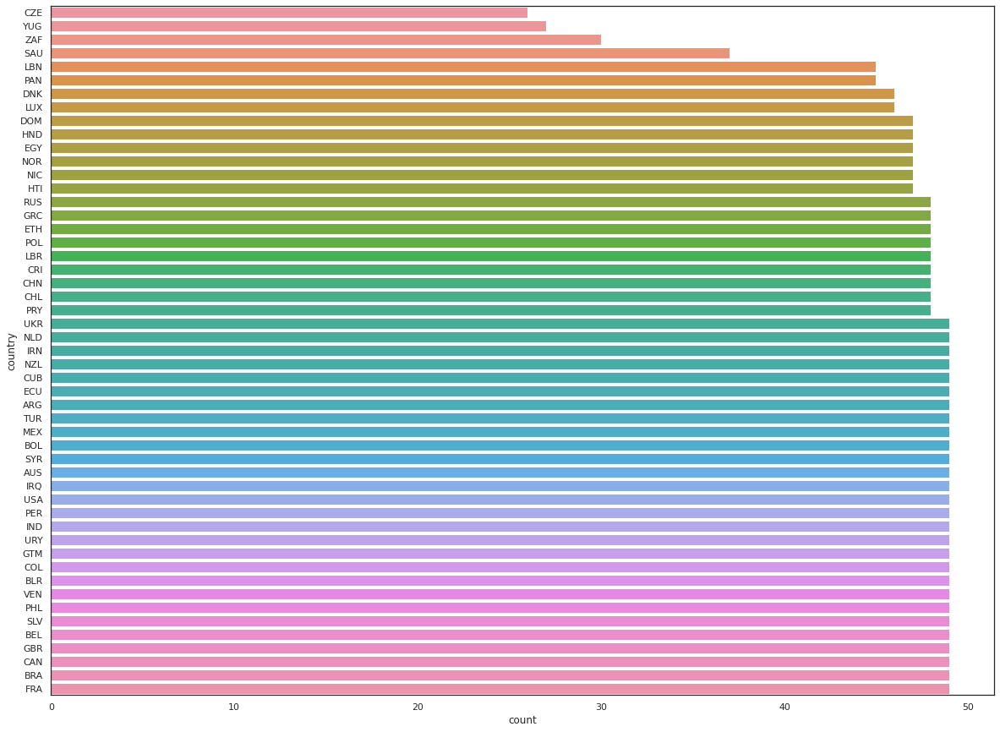

In [ ]:
# order country counts per country and get the index
order = df_un.country.value_counts(ascending=True).index
plt.figure(figsize=(20,15))
sns.countplot(y='country', data=df_un, orient='h', order=order)


## Data Cleaning

We will use regular expressions to clean out any unfavorable characters in our dataset, and then preview what the data looks like after the cleaning.

In [ ]:
df_trpt = df_un[['transcript']]

In [ ]:
df_trpt.head()

,transcript
1,177.\t : It is a fortunate coincidence that pr...
2,100.\t It is a pleasure for me to extend to y...
4,"176. No doubt each of us, before coming up to ..."
5,\n71.\t. We are today mourning the untimely de...
6,135.\t I wish to congratulate the President o...


In [ ]:
data = df_trpt['transcript'].values.tolist()

In [ ]:
# Use Regex to remove all characters except letters and space
import re
data = [re.sub(r'[^a-zA-Z ]+', '', str(sentence)) for sentence in data] 

# Remove roman numerical characters
data = [re.sub(r'(?=\b[MCDXLVI]{1,6}\b)M{0,4}(?:CM|CD|D?C{0,3})(?:XC|XL|L?X{0,3})(?:IX|IV|V?I{0,3})', '', str(sentence)) for sentence in data]

# Grouping Multiple Patterns
data = [re.sub(r'[,@\'?\.$%_]', '', str(sentence)) for sentence in data]

# Remove new line characters
data = [re.sub(r'\s+', ' ', str(sentence)) for sentence in data]

# Removing a Single Character
data = [re.sub(r'\s+[a-zA-Z]\s+', ' ', str(sentence)) for sentence in data]

In [ ]:
# Preview the first list of the cleaned data
from pprint import pprint
pprint(data[:1])

[' It is fortunate coincidence that precisely at time when the United Nations '
 'is celebrating its first twentyfive years of existence an eminent jurist so '
 'closely linked to our Organization should have been elected to preside over '
 'the General Assembly On behalf of the Argentine Government it is pleasure '
 'for me to congratulate Your Excellency Mr President on this felicitous '
 'choiceThrough you should also like to express the appreciation of the '
 'Argentine delegation to Mrs Angie BrooksRandolph of Liberia for the work she '
 'performed as President of the twentyfourth sessionFrom this rostrum the '
 'Argentine Government wishes to express to the delegation of the United Arab '
 'Republic its regret and sympathy upon the recent death of His Excellency '
 'President Gamal Abdel Nasser The loss of this outstanding statesman has not '
 'only plunged the Arab world into mourning but has also deeply grieved all '
 'those who greatly valued his capacity to contribute activel

## Preprocessing
- **Tokenization**: spliting the sentences into words, removing punctuation, ignoring tokens that are too short, and removing letter accents.
- **Lemmatization**: remove inflectional endings only and to return the orignal form of a word, which is known as the lemma. For instance, words “used”, “using”, “uses” words are all converted to “use”.
- **Ngrams implementation**: extracting sequence of ‘n’ words that occur frequently in the corpus. Here we implement bi-grams and tri-grams that mean 2 words and 3 words in sequence respectively. (bi-gram: Poisson_Process; tri-gram: central_limit_theorem)
- **Speech of tag selection**: When you call nlp on a text, spaCy first tokenizes the text to produce a Doc object. The Doc is then processed in several different steps – this is also referred to as the processing pipeline. The pipeline used by the default models consists of a tagger, a parser and an entity recognizer. In our case we will only use tagger. We will check part of speech tag of each token and keep only the nouns, adjectives, verbs, and adverbs.

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [ ]:
# Build the bigram and trigrams
# Took 2.5mins
bigram = gensim.models.Phrases(data, min_count=5, threshold=100) 
trigram = gensim.models.Phrases(bigram[data], threshold=100)  

bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [ ]:
# only need tagger, no need for parser and named entity recognizer, for faster implementation
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

In [ ]:
def process_words(texts, stop_words=stop_words, allowed_tags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    
    """Convert a document into a list of lowercase tokens, build bigrams-trigrams, implement lemmatization"""
    
    # remove stopwords, short tokens and letter accents 
    texts = [[word for word in simple_preprocess(str(doc), deacc=True, min_len=3) if word not in stop_words] for doc in texts]
    
    # bi-gram and tri-gram implementation
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    
    texts_out = []

    # implement lemmatization and filter out unwanted part of speech tags
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_tags])
    
    # remove stopwords and short tokens again after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc), deacc=True, min_len=3) if word not in stop_words] for doc in texts_out]    
    
    return texts_out

In [ ]:
# Preview the data 
# Took 7mins
data_ready = process_words(data)  
data_ready[0]

['fortunate',
 'coincidence',
 'precisely',
 'time',
 'nation',
 'celebrate',
 'first',
 'twentyfive',
 'year',
 'existence',
 'closely',
 'link',
 'organization',
 'elect',
 'government',
 'pleasure',
 'also',
 'express',
 'appreciation',
 'argentine',
 'delegation',
 'perform',
 'argentine',
 'government',
 'wish',
 'express',
 'delegation',
 'recent',
 'death',
 'outstanding',
 'plunge',
 'arab',
 'world',
 'mourning',
 'also',
 'deeply',
 'grieve',
 'greatly',
 'value',
 'capacity',
 'contribute',
 'actively',
 'establishment',
 'peace',
 'create',
 'founder',
 'fundamental',
 'purpose',
 'mind',
 'hand',
 'solemnly',
 'formulate',
 'basic',
 'principle',
 'international',
 'system',
 'establish',
 'legal',
 'framework',
 'keep',
 'political',
 'social',
 'need',
 'immediate',
 'postwar',
 'era',
 'objective',
 'result',
 'historical',
 'experience',
 'mankind',
 'interest',
 'aspiration',
 'civilize',
 'nation',
 'way',
 'renounce',
 'enunciation',
 'purpose',
 'principle',
 'nati

##  Prepare Dictionary and Corpus

In [ ]:
# Create Dictionary
id2word = corpora.Dictionary(data_ready)

print('Total Vocabulary Size:', len(id2word))

Total Vocabulary Size: 85942


In [ ]:
# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in data_ready]

In [ ]:
dict_corpus = {}

for i in range(len(corpus)):
  for index, freq in corpus[i]:
    if id2word[index] in dict_corpus:
      dict_corpus[id2word[index]] += freq
    else:
       dict_corpus[id2word[index]] = freq

In [ ]:
dict_df = pd.DataFrame.from_dict(dict_corpus, orient='index', columns=['freq'])

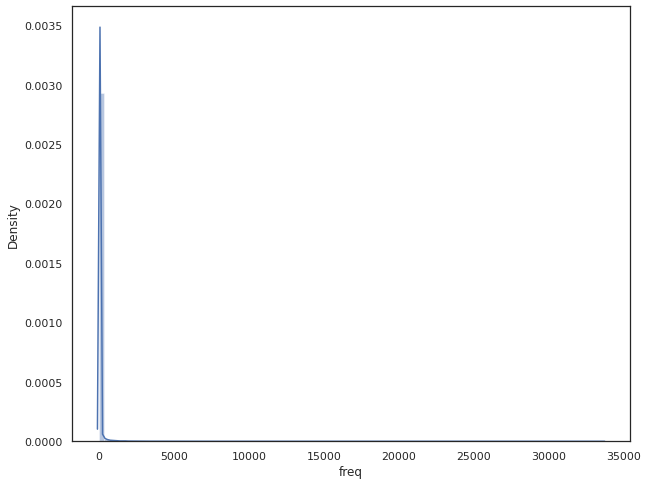

In [ ]:
plt.figure(figsize=(10,8))
sns.distplot(dict_df['freq'], bins=100);

In [ ]:
dict_df.sort_values('freq', ascending=False).head(50)

,freq
country,33631
international,23867
people,22650
world,22182
must,17690
state,17660
peace,17071
also,14751
make,14505
right,14472


## Further Cleaning

In [ ]:
extension = dict_df[dict_df.freq>15000].index.tolist()

In [ ]:
# add high frequency words to stop words list
stop_words.extend(extension)
# rerun the process_words function

# recreate Dictionary
id2word = corpora.Dictionary(data_ready)
print('Total Vocabulary Size:', len(id2word))

Total Vocabulary Size: 85942


In [ ]:
# recreate Dictionary
id2word = corpora.Dictionary(data_ready)

In [ ]:
# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in data_ready]

## LDA Model

In [ ]:
# Build LDA Model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics = 7, 
                                            random_state = 100, update_every = 1, chunksize = 100, passes = 10, alpha = 'auto', per_word_topics=True) # Here we selected 7 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.001*"thephilippine" + 0.001*"countriesand" + 0.001*"percent" + '
  '0.001*"unstoppable" + 0.001*"ofthose" + 0.001*"hadbeen" + 0.001*"ournation" '
  '+ 0.001*"speculator" + 0.001*"thosewho" + 0.001*"noone"'),
 (1,
  '0.014*"must" + 0.014*"world" + 0.009*"nation" + 0.009*"people" + '
  '0.008*"global" + 0.008*"year" + 0.006*"need" + 0.006*"today" + 0.006*"make" '
  '+ 0.006*"work"'),
 (2,
  '0.014*"international" + 0.014*"country" + 0.012*"development" + '
  '0.009*"effort" + 0.009*"state" + 0.008*"also" + 0.008*"peace" + '
  '0.007*"support" + 0.007*"security" + 0.006*"economic"'),
 (3,
  '0.025*"people" + 0.010*"country" + 0.009*"peace" + 0.008*"world" + '
  '0.008*"state" + 0.007*"syrian" + 0.007*"international" + 0.007*"war" + '
  '0.006*"right" + 0.006*"resolution"'),
 (4,
  '0.013*"country" + 0.010*"world" + 0.009*"problem" + 0.009*"international" + '
  '0.008*"state" + 0.007*"would" + 0.007*"economic" + 0.006*"nation" + '
  '0.006*"new" + 0.005*"may"'),
 (5,
  '0.016*"un

In [ ]:
# Compute perplexity
print('Perplexity: ', lda_model.log_perplexity(corpus))

# Compute coherence score
from gensim.models import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_ready, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Perplexity:  -7.887915865163535
Coherence Score:  0.3933655975289935


In [ ]:
# Compute Coherence Score using UMass
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_ready, dictionary=id2word, coherence="u_mass")
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  -2.5720738664307676


### Optimal Number of topics

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model=gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, 
                                              random_state = 100, update_every = 1, chunksize = 100, passes = 10, alpha = 'auto', per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

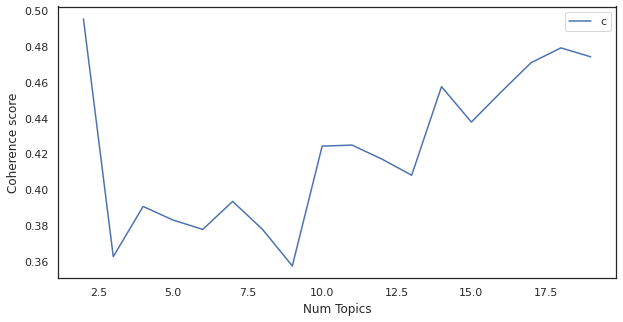

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_ready, start=2, limit=20, step=1)
# Show graph
plt.rcParams['figure.figsize'] = [10, 5]
import matplotlib.pyplot as plt
limit=20; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print('Num Topics =', m, ' has Coherence Value of', round(cv, 4))

Num Topics = 2  has Coherence Value of 0.4954
Num Topics = 3  has Coherence Value of 0.3625
Num Topics = 4  has Coherence Value of 0.3905
Num Topics = 5  has Coherence Value of 0.383
Num Topics = 6  has Coherence Value of 0.3777
Num Topics = 7  has Coherence Value of 0.3934
Num Topics = 8  has Coherence Value of 0.3778
Num Topics = 9  has Coherence Value of 0.3573
Num Topics = 10  has Coherence Value of 0.4243
Num Topics = 11  has Coherence Value of 0.4249
Num Topics = 12  has Coherence Value of 0.417
Num Topics = 13  has Coherence Value of 0.408
Num Topics = 14  has Coherence Value of 0.4575
Num Topics = 15  has Coherence Value of 0.4377
Num Topics = 16  has Coherence Value of 0.4546
Num Topics = 17  has Coherence Value of 0.4709
Num Topics = 18  has Coherence Value of 0.4792
Num Topics = 19  has Coherence Value of 0.4742


# Updated LDA Model

In [ ]:
# Build LDA Model
import warnings
warnings.filterwarnings('ignore')
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics = 14, 
                                            random_state = 100, update_every = 1, chunksize = 100, passes = 14, alpha = 'auto', per_word_topics=True) # Here we selected 14 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.006*"parent" + 0.005*"thegeneral" + 0.004*"ofinternational" + '
  '0.004*"vulture" + 0.003*"thegreat" + 0.003*"thatwe" + 0.003*"reintegration" '
  '+ 0.003*"topromote" + 0.002*"adolescent" + 0.002*"ourcountry"'),
 (1,
  '0.018*"development" + 0.018*"country" + 0.014*"international" + '
  '0.010*"world" + 0.010*"effort" + 0.008*"economic" + 0.008*"also" + '
  '0.008*"global" + 0.008*"continue" + 0.008*"support"'),
 (2,
  '0.015*"country" + 0.012*"international" + 0.010*"state" + '
  '0.009*"government" + 0.009*"right" + 0.008*"peace" + 0.007*"must" + '
  '0.007*"political" + 0.007*"human" + 0.007*"also"'),
 (3,
  '0.012*"problem" + 0.010*"country" + 0.009*"would" + 0.008*"state" + '
  '0.008*"international" + 0.008*"world" + 0.007*"make" + 0.007*"may" + '
  '0.006*"nation" + 0.006*"economic"'),
 (4,
  '0.016*"must" + 0.010*"nation" + 0.010*"year" + 0.008*"work" + 0.008*"world" '
  '+ 0.008*"make" + 0.007*"also" + 0.007*"need" + 0.007*"global" + '
  '0.007*"human"'),
 (5,
  '0.

In [ ]:
# Compute perplexity
print('Perplexity: ', lda_model.log_perplexity(corpus))

# Compute coherence score
from gensim.models import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_ready, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Perplexity:  -7.881019650538076
Coherence Score:  0.4328585121989752


#### Obtaining topic distributions for all documents

In [ ]:
lda_tm_results = [lda_model.get_document_topics(item, minimum_probability=0.0) for item in corpus]

In [ ]:

lda_tm_results

[[(0, 0.00066339626),
  (1, 0.10243842),
  (2, 0.17545365),
  (3, 0.6365981),
  (4, 0.020418879),
  (5, 0.03702322),
  (6, 0.00058618665),
  (7, 6.181581e-05),
  (8, 0.007801371),
  (9, 0.013999976),
  (10, 0.0033677684),
  (11, 3.482104e-05),
  (12, 0.0015129991),
  (13, 3.9424034e-05)],
 [(0, 4.9443697e-05),
  (1, 0.20277059),
  (2, 0.037200004),
  (3, 0.46982715),
  (4, 0.16263217),
  (5, 0.08368863),
  (6, 0.0015658692),
  (7, 5.750801e-05),
  (8, 0.0152266165),
  (9, 0.017945169),
  (10, 0.007927186),
  (11, 3.2394008e-05),
  (12, 5.1679697e-05),
  (13, 0.0010255672)],
 [(0, 6.0953807e-05),
  (1, 0.18942054),
  (2, 0.1554171),
  (3, 0.53956395),
  (4, 0.058484044),
  (5, 0.0376872),
  (6, 0.0012885587),
  (7, 0.0013104894),
  (8, 0.012061886),
  (9, 0.0005991884),
  (10, 0.003957228),
  (11, 3.9935083e-05),
  (12, 6.3710286e-05),
  (13, 4.5214096e-05)],
 [(0, 5.3204676e-05),
  (1, 0.10731317),
  (2, 0.086097986),
  (3, 0.22410315),
  (4, 0.01316866),
  (5, 0.16426611),
  (6, 0.001

In [ ]:
lda_corpus_topics = [sorted(topics, key=lambda record: -record[1])[0] for topics in lda_tm_results]

In [ ]:
lda_corpus_topics

[(3, 0.6365981),
 (3, 0.46982715),
 (3, 0.53956395),
 (8, 0.33824337),
 (3, 0.5020558),
 (3, 0.6057048),
 (3, 0.47299594),
 (3, 0.53513354),
 (3, 0.48397037),
 (5, 0.4385567),
 (3, 0.66425735),
 (3, 0.54723),
 (3, 0.56231076),
 (3, 0.40122807),
 (3, 0.5655908),
 (3, 0.5408397),
 (3, 0.46244824),
 (3, 0.4083836),
 (3, 0.51331127),
 (9, 0.39673886),
 (3, 0.47081363),
 (3, 0.46269715),
 (3, 0.6307703),
 (3, 0.59780294),
 (3, 0.50007075),
 (3, 0.49295864),
 (3, 0.4895846),
 (3, 0.48120853),
 (3, 0.6359557),
 (3, 0.5988834),
 (3, 0.3785041),
 (3, 0.57633704),
 (3, 0.4073344),
 (3, 0.54032296),
 (3, 0.41324332),
 (3, 0.52012616),
 (3, 0.4593264),
 (3, 0.47564688),
 (3, 0.59163487),
 (3, 0.47530848),
 (3, 0.5909652),
 (3, 0.31422424),
 (3, 0.44297183),
 (3, 0.4742914),
 (3, 0.46498904),
 (3, 0.39038977),
 (3, 0.37175775),
 (3, 0.61066496),
 (5, 0.57295364),
 (3, 0.6153345),
 (3, 0.58491194),
 (9, 0.60074747),
 (3, 0.609691),
 (3, 0.60523736),
 (3, 0.45095593),
 (3, 0.61115223),
 (2, 0.5116096

In [ ]:
lda_model.num_topics

14

In [ ]:
ldamallet.num_topics

16

In [ ]:
# topics

In [ ]:
#lda_topics = lda_model.show_topic(17, topn=20)
#lda_topics

In [ ]:
lda_topics = [[(term, round(wt, 3)) for term, wt in lda_model.show_topic(n, topn=20)] for n in range(0, lda_model.num_topics)]
lda_topics

[[('parent', 0.006),
  ('thegeneral', 0.005),
  ('ofinternational', 0.004),
  ('vulture', 0.004),
  ('thegreat', 0.003),
  ('thatwe', 0.003),
  ('reintegration', 0.003),
  ('topromote', 0.003),
  ('adolescent', 0.002),
  ('ourcountry', 0.002),
  ('andsecurity', 0.002),
  ('donot', 0.002),
  ('prayer', 0.002),
  ('fightagainst', 0.002),
  ('thefight', 0.002),
  ('bravery', 0.001),
  ('toexpress', 0.001),
  ('almighty', 0.001),
  ('wewill', 0.001),
  ('exclusionary', 0.001)],
 [('development', 0.018),
  ('country', 0.018),
  ('international', 0.014),
  ('world', 0.01),
  ('effort', 0.01),
  ('economic', 0.008),
  ('also', 0.008),
  ('global', 0.008),
  ('continue', 0.008),
  ('support', 0.008),
  ('develop', 0.007),
  ('year', 0.007),
  ('issue', 0.006),
  ('peace', 0.006),
  ('security', 0.006),
  ('must', 0.006),
  ('new', 0.006),
  ('change', 0.005),
  ('need', 0.005),
  ('make', 0.005)],
 [('country', 0.015),
  ('international', 0.012),
  ('state', 0.01),
  ('government', 0.009),
  (

In [ ]:
lda_topics_df = pd.DataFrame([[term for term, wt in topic] for topic in lda_topics], columns = ['Key_words'+str(i) for i in range(1, 21)],
                         index=['Topic '+str(t) for t in range(1, lda_model.num_topics+1)]).T
lda_topics_df.head()

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14
Key_words1,parent,development,country,problem,must,people,turkish,denmark,nuclear,people,country,unitedstate,unitednation,climatechange
Key_words2,thegeneral,country,international,country,nation,world,greek,theunited,state,international,cent,massdestruction,theunite,marrakech
Key_words3,ofinternational,international,state,would,year,country,cypriot,inthe,weapon,resolution,poverty,wewould,reform,liberian
Key_words4,vulture,world,government,state,work,government,panamanian,danish,international,peace,drug,peoplecentre,generalassembly,cop
Key_words5,thegreat,effort,right,international,world,war,canal,upcome,relation,syrian,world,professionalism,onthe,hadbeen


In [ ]:
pd.set_option('display.max_colwidth', -1)

lda_topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in lda_topics], columns = ['Key_Words_per_Topic'],
                         index=['Topic'+str(t) for t in range(1, lda_model.num_topics+1)] )
lda_topics_df

,Key_Words_per_Topic
Topic1,"parent, thegeneral, ofinternational, vulture, thegreat, thatwe, reintegration, topromote, adolescent, ourcountry, andsecurity, donot, prayer, fightagainst, thefight, bravery, toexpress, almighty, wewill, exclusionary"
Topic2,"development, country, international, world, effort, economic, also, global, continue, support, develop, year, issue, peace, security, must, new, change, need, make"
Topic3,"country, international, state, government, right, peace, must, political, human, also, respect, social, people, order, development, make, support, law, process, promote"
Topic4,"problem, country, would, state, international, world, make, may, nation, economic, time, take, year, new, great, situation, government, concern, organization, must"
Topic5,"must, nation, year, work, world, make, also, need, global, human, challenge, time, many, conflict, right, today, take, would, security, peace"
Topic6,"people, world, country, government, war, power, say, today, right, year, military, nation, peace, live, life, struggle, come, know, impose, history"
Topic7,"turkish, greek, cypriot, panamanian, canal, balkan, childhood, contiguous, securityand, councilwe, interoceanic, yugoslav, maritime, accessibility, clearing, endit, albanian, fluid, longeststande, undermined"
Topic8,"denmark, theunited, inthe, danish, upcome, norway, panel, reproductive, crosscut, ofthose, globalization, timorleste, partof, ourcommitment, norwegian, hivaid, recommendation, thenegotiation, thetwo, wecannot"
Topic9,"nuclear, state, weapon, international, relation, country, military, security, arm, force, people, principle, interest, peace, chinese, disarmament, war, policy, peaceful, important"
Topic10,"people, international, resolution, peace, syrian, region, palestinian, state, terrorism, right, security, call, force, continue, country, principle, support, also, territory, iraqi"


### LDA Model Topic Word Cloud

In [ ]:
from wordcloud import WordCloud

In [ ]:
wc = WordCloud(background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42)

In [ ]:
plt.rcParams['figure.figsize'] = [25, 18]

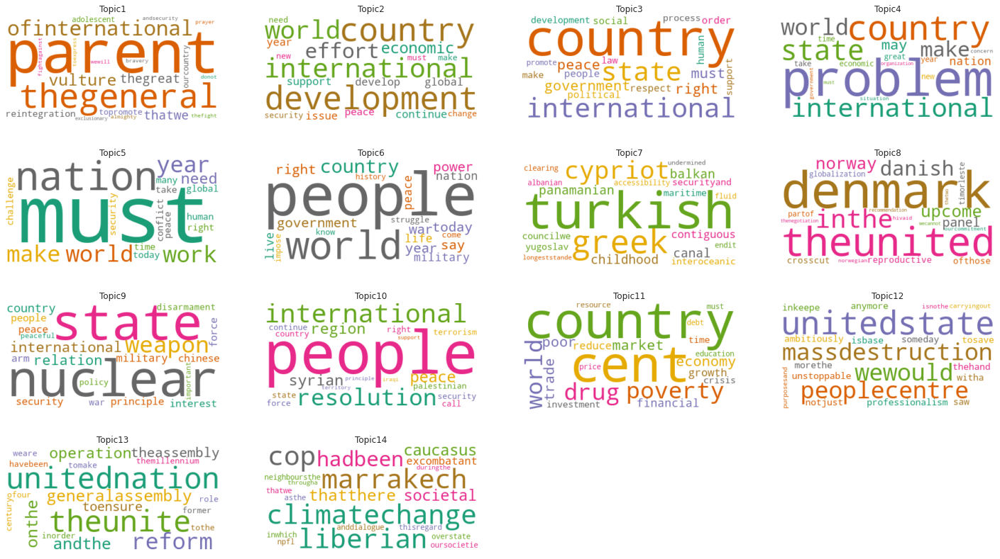

In [ ]:
# Create subplots for each topic
for i in range(14):

    wc.generate(text=lda_topics_df["Key_Words_per_Topic"][i])
    
    plt.subplot(5, 4, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(lda_topics_df.index[i])

plt.show()

### LDA Model Interactive Topic Visualization
 interactive graph shows the topics and relative terms. You can interactively inestigate each bubbles and get the most relevant 30 words on the right.

In [ ]:
# Plotting tools
import pyLDAvis

In [ ]:
import pyLDAvis.gensim as gensimvis

lda_vis = gensimvis.prepare(lda_model, corpus, id2word, sort_topics=False)
pyLDAvis.display(lda_vis)

### Dominant Topics for each assembly speech

In [ ]:
# create a dataframe 
lda_corpus_topic_df = pd.DataFrame()

# get the Titles from the original dataframe
lda_corpus_topic_df['country'] = df_un.country.reset_index(drop = True)

lda_corpus_topic_df['Dominant Topic'] = [item[0]+1 for item in lda_corpus_topics]
lda_corpus_topic_df['Contribution %'] = [round(item[1]*100, 2) for item in lda_corpus_topics]
lda_corpus_topic_df['Topic Terms'] = [lda_topics_df.iloc[t[0]]['Key_Words_per_Topic'] for t in lda_corpus_topics]

lda_corpus_topic_df.head(5)


,country,Dominant Topic,Contribution %,Topic Terms
0,ARG,4,63.66,"problem, country, would, state, international, world, make, may, nation, economic, time, take, year, new, great, situation, government, concern, organization, must"
1,AUS,4,46.98,"problem, country, would, state, international, world, make, may, nation, economic, time, take, year, new, great, situation, government, concern, organization, must"
2,BEL,4,53.96,"problem, country, would, state, international, world, make, may, nation, economic, time, take, year, new, great, situation, government, concern, organization, must"
3,BLR,9,33.82,"nuclear, state, weapon, international, relation, country, military, security, arm, force, people, principle, interest, peace, chinese, disarmament, war, policy, peaceful, important"
4,BOL,4,50.21,"problem, country, would, state, international, world, make, may, nation, economic, time, take, year, new, great, situation, government, concern, organization, must"


### Dominant Topic Percentage


In [ ]:
lda_dominant_topic_df = lda_corpus_topic_df.groupby('Dominant Topic').agg(
                                  Doc_Count = ('Dominant Topic', np.size),
                                  Total_Docs_Perc = ('Dominant Topic', np.size)).reset_index()

lda_dominant_topic_df['Total_Docs_Perc'] = lda_dominant_topic_df['Total_Docs_Perc'].apply(lambda row: round((row*100) / len(corpus), 2))

lda_dominant_topic_df.sort_values('Total_Docs_Perc')

,Dominant Topic,Doc_Count,Total_Docs_Perc
5,9,48,2.01
7,11,52,2.18
4,6,126,5.28
6,10,183,7.66
3,5,348,14.57
1,3,413,17.29
2,4,589,24.66
0,2,629,26.34


We can see that the sustainbility is assigned to topic 2, and it has a good dominating power among all

## LDA Topic Weights for each Topic

In [ ]:
pprint(lda_tm_results[0])

[(0, 4.401951e-05),
 (1, 0.00058244204),
 (2, 0.09500332),
 (3, 0.01577738),
 (4, 0.3131695),
 (5, 0.037069116),
 (6, 0.0007694866),
 (7, 0.496315),
 (8, 0.0016558196),
 (9, 0.009014222),
 (10, 5.4023552e-05),
 (11, 2.6198137e-05),
 (12, 6.0633174e-05),
 (13, 0.00063418795),
 (14, 0.00017479742),
 (15, 0.029555013),
 (16, 4.206433e-05),
 (17, 5.279755e-05)]


In [ ]:
lda_df_weights = pd.DataFrame.from_records([{v: k for v, k in row} for row in lda_tm_results])
lda_df_weights.columns = ['Topic ' + str(i) for i in range(1,15)]
lda_df_weights

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14
0,0.000663,0.102438,0.175454,0.636598,0.020419,0.037023,0.000586,0.000062,0.007801,0.014000,0.003368,0.000035,0.001513,0.000039
1,0.000049,0.202771,0.037200,0.469827,0.162632,0.083689,0.001566,0.000058,0.015227,0.017945,0.007927,0.000032,0.000052,0.001026
2,0.000061,0.189421,0.155417,0.539564,0.058484,0.037687,0.001289,0.001310,0.012062,0.000599,0.003957,0.000040,0.000064,0.000045
3,0.000053,0.107313,0.086098,0.224103,0.013169,0.164266,0.001118,0.000062,0.338243,0.064110,0.000350,0.000035,0.000508,0.000571
4,0.000529,0.084297,0.243828,0.502056,0.013735,0.127573,0.003359,0.000985,0.001595,0.010604,0.011327,0.000030,0.000049,0.000035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2383,0.001813,0.208996,0.057205,0.013929,0.385019,0.091531,0.001759,0.000095,0.098516,0.126496,0.013625,0.000053,0.000085,0.000877
2384,0.000151,0.239912,0.352890,0.068869,0.139793,0.130490,0.000154,0.000176,0.000353,0.004973,0.061868,0.000099,0.000158,0.000112
2385,0.000068,0.080562,0.009371,0.010529,0.432751,0.302144,0.000070,0.001446,0.006915,0.062908,0.091709,0.000045,0.000071,0.001413
2386,0.000661,0.081780,0.132148,0.046360,0.118710,0.535477,0.000061,0.000670,0.008252,0.038199,0.036935,0.000039,0.000063,0.000645


In [ ]:
df_un['year'].reset_index(drop=True)

0       1970
1       1970
2       1970
3       1970
4       1970
        ... 
2383    2018
2384    2018
2385    2018
2386    2018
2387    2018
Name: year, Length: 2388, dtype: int64

In [ ]:
lda_df_weights['year'] = df_un.year.reset_index(drop=True)

In [ ]:
lda_df_weights.head(5)

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,year
0,0.000663,0.102438,0.175454,0.636598,0.020419,0.037023,0.000586,0.000062,0.007801,0.014000,0.003368,0.000035,0.001513,0.000039,1970
1,0.000049,0.202771,0.037200,0.469827,0.162632,0.083689,0.001566,0.000058,0.015227,0.017945,0.007927,0.000032,0.000052,0.001026,1970
2,0.000061,0.189421,0.155417,0.539564,0.058484,0.037687,0.001289,0.001310,0.012062,0.000599,0.003957,0.000040,0.000064,0.000045,1970
3,0.000053,0.107313,0.086098,0.224103,0.013169,0.164266,0.001118,0.000062,0.338243,0.064110,0.000350,0.000035,0.000508,0.000571,1970
4,0.000529,0.084297,0.243828,0.502056,0.013735,0.127573,0.003359,0.000985,0.001595,0.010604,0.011327,0.000030,0.000049,0.000035,1970


We decided to find most dominant topic for each document rather than averaging the topic weights and then compute the percentage of documents in a given year where the topic is the most dominant

In [ ]:
lda_df_weights['prevalent'] = lda_df_weights.drop('year', axis=1).idxmax(axis=1)

In [ ]:
lda_df_weights.head(8)

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,year,prevalent
0,0.000663,0.102438,0.175454,0.636598,0.020419,0.037023,0.000586,0.000062,0.007801,0.014000,0.003368,0.000035,0.001513,0.000039,1970,Topic 4
1,0.000049,0.202771,0.037200,0.469827,0.162632,0.083689,0.001566,0.000058,0.015227,0.017945,0.007927,0.000032,0.000052,0.001026,1970,Topic 4
2,0.000061,0.189421,0.155417,0.539564,0.058484,0.037687,0.001289,0.001310,0.012062,0.000599,0.003957,0.000040,0.000064,0.000045,1970,Topic 4
3,0.000053,0.107313,0.086098,0.224103,0.013169,0.164266,0.001118,0.000062,0.338243,0.064110,0.000350,0.000035,0.000508,0.000571,1970,Topic 9
4,0.000529,0.084297,0.243828,0.502056,0.013735,0.127573,0.003359,0.000985,0.001595,0.010604,0.011327,0.000030,0.000049,0.000035,1970,Topic 4
5,0.000063,0.171231,0.084304,0.605705,0.030700,0.076831,0.002584,0.000073,0.007872,0.015168,0.004686,0.000041,0.000066,0.000677,1970,Topic 4
6,0.000149,0.269563,0.018019,0.472996,0.203812,0.014109,0.000152,0.000173,0.000349,0.019389,0.000926,0.000098,0.000156,0.000110,1970,Topic 4
7,0.000048,0.079220,0.206340,0.535134,0.015108,0.102098,0.002482,0.000056,0.005672,0.042205,0.009563,0.000032,0.001042,0.001001,1970,Topic 4


We computed the prevalence of topics by identifying the topic with the highest weight per document, grouping the results by year, and adding up the number of top frequencies of each topic per year and dividing by the total number of documents per year

In [ ]:
lda_df_weights.groupby('year')['prevalent'].value_counts(normalize=True)

year  prevalent
1970  Topic 4      0.921053
      Topic 10     0.026316
      Topic 6      0.026316
      Topic 9      0.026316
1971  Topic 4      0.893617
                     ...   
2018  Topic 5      0.340000
      Topic 3      0.260000
      Topic 2      0.220000
      Topic 10     0.100000
      Topic 6      0.080000
Name: prevalent, Length: 313, dtype: float64

In [ ]:
lda_df_dominance = lda_df_weights.groupby('year')['prevalent'].value_counts(normalize=True).unstack().fillna(0)
lda_df_dominance


prevalent,Topic 10,Topic 11,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 9
year,,,,,,,,
1970,0.026316,0.000000,0.000000,0.000000,0.921053,0.000000,0.026316,0.026316
1971,0.042553,0.000000,0.000000,0.042553,0.893617,0.000000,0.021277,0.000000
1972,0.062500,0.000000,0.000000,0.062500,0.812500,0.000000,0.020833,0.041667
1973,0.061224,0.000000,0.000000,0.020408,0.836735,0.000000,0.020408,0.061224
1974,0.041667,0.000000,0.125000,0.041667,0.708333,0.000000,0.020833,0.062500
1975,0.044444,0.000000,0.044444,0.000000,0.822222,0.000000,0.022222,0.066667
1976,0.063830,0.000000,0.085106,0.021277,0.723404,0.021277,0.042553,0.042553
1977,0.104167,0.000000,0.187500,0.041667,0.562500,0.020833,0.041667,0.041667
1978,0.085106,0.000000,0.170213,0.042553,0.574468,0.000000,0.042553,0.085106


## LDA Topic Distribution from 1970 to 2018

In [ ]:
lda_df_dominance_year = lda_df_weights.groupby('year')['prevalent'].value_counts(normalize=True).unstack().fillna(0).reset_index().copy()
lda_df_dominance_year.head(5)

prevalent,year,Topic 10,Topic 11,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 9
0,1970,0.026316,0.0,0.000,0.000000,0.921053,0.0,0.026316,0.026316
1,1971,0.042553,0.0,0.000,0.042553,0.893617,0.0,0.021277,0.000000
2,1972,0.062500,0.0,0.000,0.062500,0.812500,0.0,0.020833,0.041667
3,1973,0.061224,0.0,0.000,0.020408,0.836735,0.0,0.020408,0.061224
4,1974,0.041667,0.0,0.125,0.041667,0.708333,0.0,0.020833,0.062500


In [ ]:

df_melted_year = lda_df_dominance_year.melt(id_vars= 'year' , value_vars=['Topic ' + str(i) for i in [10, 11, 2, 3, 4, 5, 6, 9]], var_name='Topic', value_name='prevelance')

In [ ]:
df_melted_year

,year,Topic,prevelance
0,1970,Topic 10,0.026316
1,1971,Topic 10,0.042553
2,1972,Topic 10,0.062500
3,1973,Topic 10,0.061224
4,1974,Topic 10,0.041667
...,...,...,...
387,2014,Topic 9,0.000000
388,2015,Topic 9,0.000000
389,2016,Topic 9,0.000000
390,2017,Topic 9,0.000000


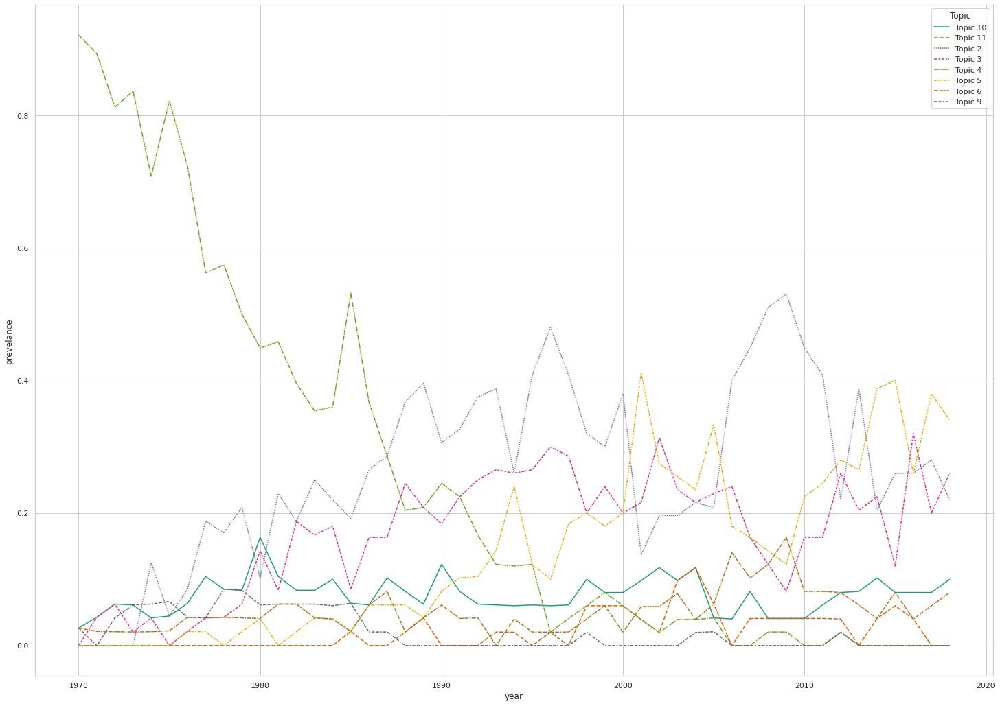

In [ ]:
sns.set_style("whitegrid")
_ = sns.lineplot(data=df_melted_year, x="year", y="prevelance", hue="Topic", style="Topic", palette='Dark2')


We can see that some topics are not prevalent enough, hence those topics will be excluded 

## LDA Topic Distribution across different countries

Let's then add the country and find the average prevelance of topics for each country in a given year.

In [ ]:
lda_df_weights["country"] = df_un.country.reset_index(drop=True)

In [ ]:
lda_df_weights.head(4)

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,year,prevalent,country
0,0.000663,0.102438,0.175454,0.636598,0.020419,0.037023,0.000586,0.000062,0.007801,0.014000,0.003368,0.000035,0.001513,0.000039,1970,Topic 4,ARG
1,0.000049,0.202771,0.037200,0.469827,0.162632,0.083689,0.001566,0.000058,0.015227,0.017945,0.007927,0.000032,0.000052,0.001026,1970,Topic 4,AUS
2,0.000061,0.189421,0.155417,0.539564,0.058484,0.037687,0.001289,0.001310,0.012062,0.000599,0.003957,0.000040,0.000064,0.000045,1970,Topic 4,BEL
3,0.000053,0.107313,0.086098,0.224103,0.013169,0.164266,0.001118,0.000062,0.338243,0.064110,0.000350,0.000035,0.000508,0.000571,1970,Topic 9,BLR


In [ ]:
lda_df_country = lda_df_weights.groupby(['country', 'year'])['prevalent'].value_counts(normalize=True).unstack().fillna(0)
lda_df_country

prevalent     Topic 10  Topic 11  Topic 2  ...  Topic 5  Topic 6  Topic 9
country year                               ...                           
ARG     1970  0.0       0.0       0.0      ...  0.0      0.0      0.0    
        1971  0.0       0.0       0.0      ...  0.0      0.0      0.0    
        1972  0.0       0.0       0.0      ...  0.0      0.0      0.0    
        1973  0.0       0.0       0.0      ...  0.0      0.0      0.0    
        1974  0.0       0.0       0.0      ...  0.0      0.0      0.0    
...           ...       ...       ...      ...  ...      ...      ...    
ZAF     2014  0.0       0.0       1.0      ...  0.0      0.0      0.0    
        2015  0.0       0.0       1.0      ...  0.0      0.0      0.0    
        2016  0.0       0.0       1.0      ...  0.0      0.0      0.0    
        2017  0.0       0.0       1.0      ...  0.0      0.0      0.0    
        2018  0.0       0.0       0.0      ...  1.0      0.0      0.0    

[2388 rows x 8 columns]

In [ ]:
lda_df_country.reset_index(inplace=True)


In [ ]:
lda_df_country

prevalent,country,year,Topic 10,Topic 11,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 9
0,ARG,1970,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,ARG,1971,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,ARG,1972,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,ARG,1973,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,ARG,1974,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2383,ZAF,2014,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2384,ZAF,2015,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2385,ZAF,2016,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2386,ZAF,2017,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_melted = lda_df_country.melt(id_vars=['country', 'year'], value_vars=['Topic ' + str(i) for i in [10, 11, 2, 3, 4, 5, 6, 9]], var_name='Topic', value_name='prevelance')

In [ ]:
df_melted.head(10)

,country,year,Topic,prevelance
0,ARG,1970,Topic 10,0.0
1,ARG,1971,Topic 10,0.0
2,ARG,1972,Topic 10,0.0
3,ARG,1973,Topic 10,0.0
4,ARG,1974,Topic 10,0.0
5,ARG,1975,Topic 10,0.0
6,ARG,1976,Topic 10,0.0
7,ARG,1977,Topic 10,0.0
8,ARG,1978,Topic 10,0.0
9,ARG,1979,Topic 10,0.0


## Topic Distribution Plot

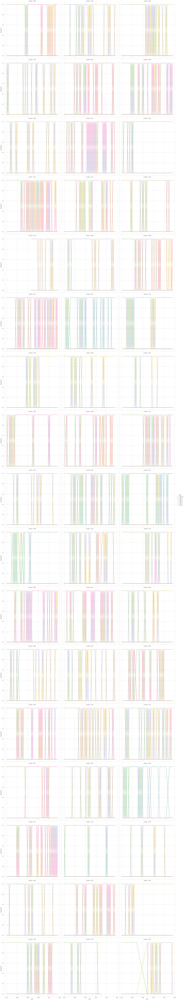

In [ ]:
sns.relplot(x='year', y="prevelance", col="country", col_wrap=3, hue='Topic',
data=df_melted,
kind="line",
height=10,
style="Topic",
dashes=False,
ci=None,
palette='Dark2');

## Stacked Area Visualization

In [ ]:
lda_df_country

prevalent,country,year,Topic 10,Topic 11,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 9
0,ARG,1970,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,ARG,1971,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,ARG,1972,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,ARG,1973,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,ARG,1974,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2383,ZAF,2014,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2384,ZAF,2015,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2385,ZAF,2016,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2386,ZAF,2017,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
lda_df_country.set_index(['country', 'year'], inplace=True)

In [ ]:
# set the figure size
plt.rcParams['figure.figsize'] = [10, 6]

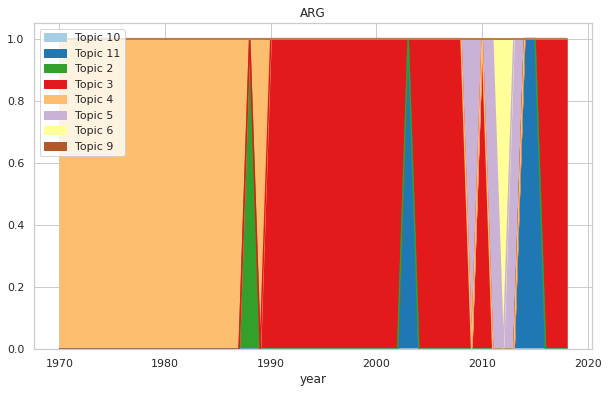

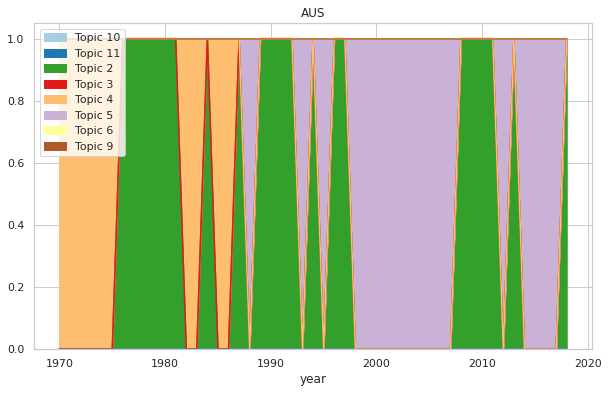

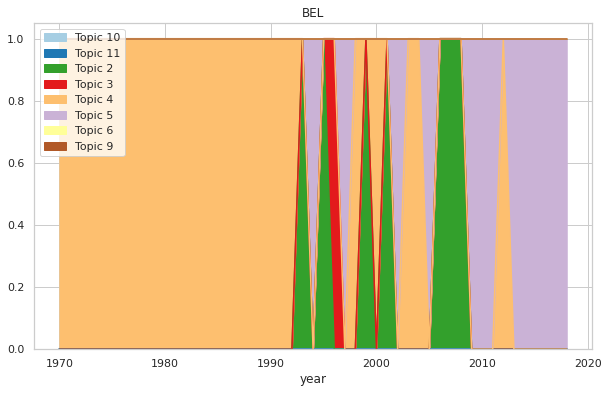

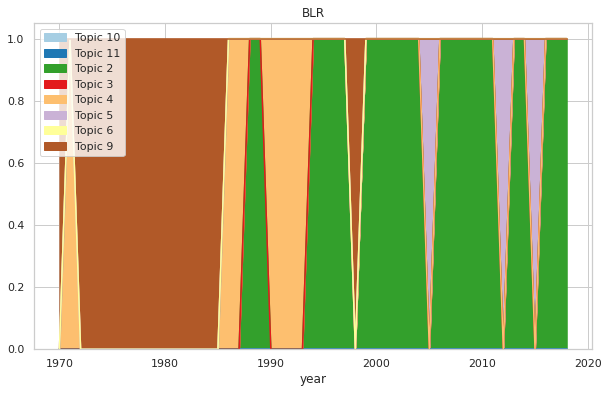

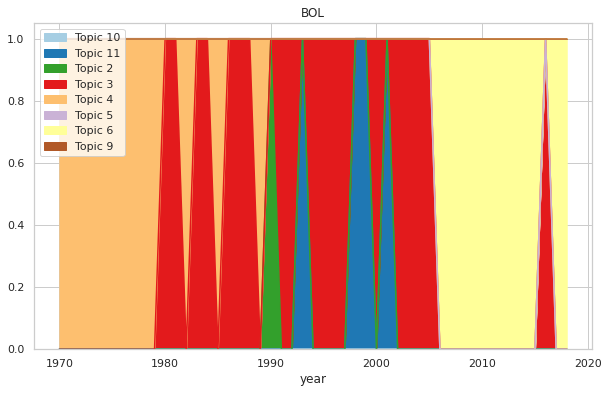

...

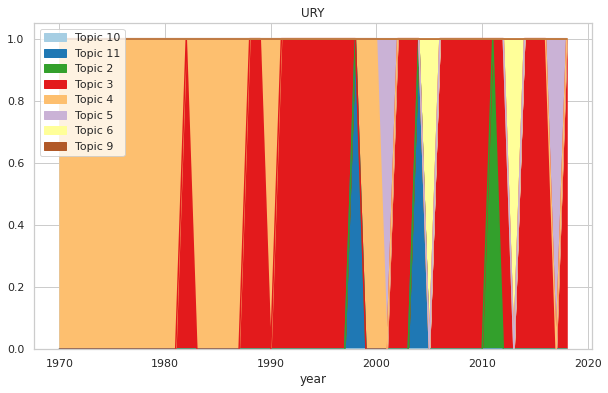

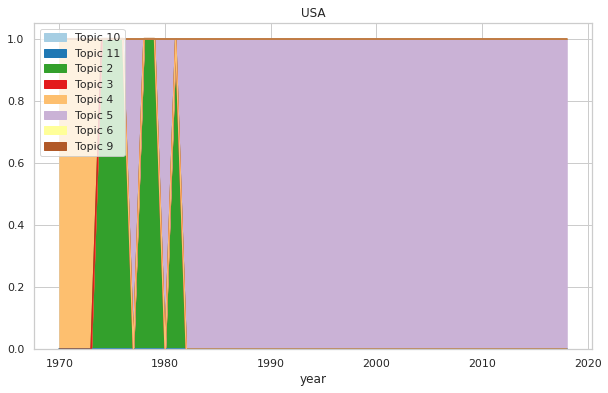

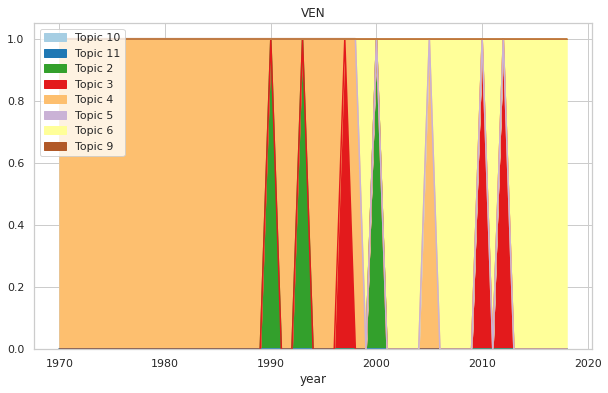

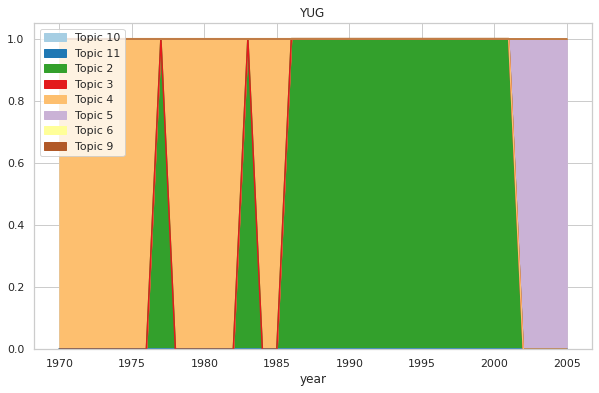

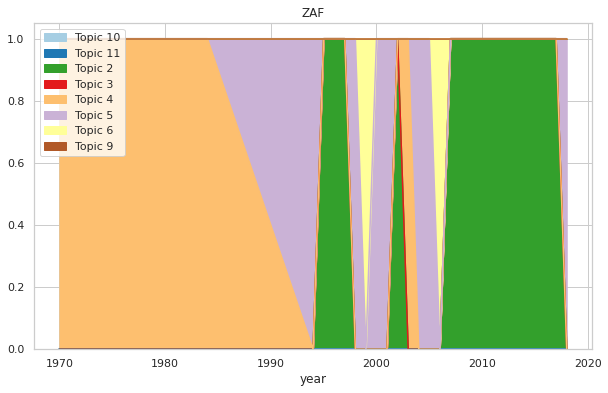

In [ ]:
for j in lda_df_country.index.levels[0]:
  lda_df_country.xs(j, level=0).plot.area(colormap = 'Paired')
  plt.title(j)
  plt.legend(loc='upper left')

plt.show()

# LDA Mallet Model (UMASS Version LDA)

In [ ]:
!wget http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip #One time only while connected

--2021-05-19 09:57:33--  http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
Resolving mallet.cs.umass.edu (mallet.cs.umass.edu)... 128.119.246.70
Connecting to mallet.cs.umass.edu (mallet.cs.umass.edu)|128.119.246.70|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16184794 (15M) [application/zip]
Saving to: ‘mallet-2.0.8.zip’

mallet-2.0.8.zip    100%[===================>]  15.43M  5.45MB/s    in 2.8s    

2021-05-19 09:57:36 (5.45 MB/s) - ‘mallet-2.0.8.zip’ saved [16184794/16184794]



In [ ]:
!unzip mallet-2.0.8.zip #one time only while connected

Archive:  mallet-2.0.8.zip
   creating: mallet-2.0.8/
   creating: mallet-2.0.8/bin/
  inflating: mallet-2.0.8/bin/classifier2info  
  inflating: mallet-2.0.8/bin/csv2classify  
  inflating: mallet-2.0.8/bin/csv2vectors  
  inflating: mallet-2.0.8/bin/mallet  
  inflating: mallet-2.0.8/bin/mallet.bat  
  inflating: mallet-2.0.8/bin/mallethon  
  inflating: mallet-2.0.8/bin/prepend-license.sh  
  inflating: mallet-2.0.8/bin/svmlight2vectors  
  inflating: mallet-2.0.8/bin/text2classify  
  inflating: mallet-2.0.8/bin/text2vectors  
  inflating: mallet-2.0.8/bin/vectors2classify  
  inflating: mallet-2.0.8/bin/vectors2info  
  inflating: mallet-2.0.8/bin/vectors2topics  
  inflating: mallet-2.0.8/bin/vectors2vectors  
  inflating: mallet-2.0.8/build.xml  
   creating: mallet-2.0.8/class/
   creating: mallet-2.0.8/class/cc/
   creating: mallet-2.0.8/class/cc/mallet/
   creating: mallet-2.0.8/class/cc/mallet/classify/
  inflating: mallet-2.0.8/class/cc/mallet/classify/AdaBoost.class  
  in

In [ ]:
mallet_path = '/content/mallet-2.0.8/bin/mallet'

In [ ]:
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=16, id2word=id2word)

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:479: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)
/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:479: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)


In [ ]:
# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_ready, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('Coherence Score: ', coherence_ldamallet)

Coherence Score:  0.37171290316046557


In [ ]:
from pprint import pprint
# display topics
pprint(ldamallet.show_topics(formatted=True))

[(13,
  '0.034*"people" + 0.024*"world" + 0.019*"nation" + 0.012*"human" + '
  '0.011*"terrorism" + 0.010*"terrorist" + 0.010*"war" + 0.009*"live" + '
  '0.009*"today" + 0.009*"freedom"'),
 (1,
  '0.029*"peace" + 0.019*"resolution" + 0.018*"international" + 0.017*"region" '
  '+ 0.014*"security" + 0.011*"effort" + 0.011*"call" + 0.011*"palestinian" + '
  '0.010*"state" + 0.010*"continue"'),
 (2,
  '0.069*"country" + 0.031*"economic" + 0.029*"develop" + 0.022*"world" + '
  '0.016*"international" + 0.012*"debt" + 0.011*"economy" + 0.010*"increase" + '
  '0.010*"trade" + 0.010*"resource"'),
 (12,
  '0.017*"unitednation" + 0.013*"theunite" + 0.012*"nation" + 0.006*"process" '
  '+ 0.006*"reform" + 0.004*"globalization" + 0.004*"summit" + '
  '0.004*"generalassembly" + 0.004*"terrorism" + 0.003*"commitment"'),
 (4,
  '0.035*"international" + 0.031*"country" + 0.024*"economic" + '
  '0.022*"problem" + 0.020*"development" + 0.018*"cooperation" + '
  '0.015*"effort" + 0.014*"develop" + 0.014*"

## Optimal Number of Topics for Mallet Model

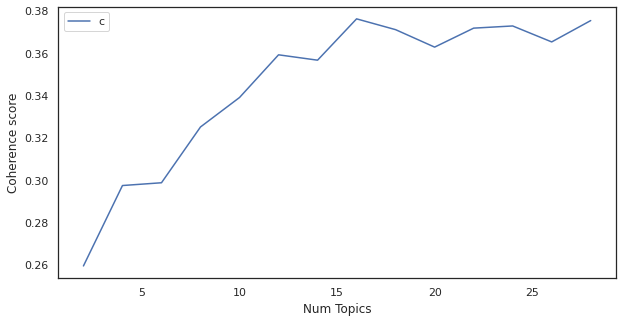

In [ ]:
import matplotlib.pyplot as plt
# Compute a list of LDA Mallet Models and corresponding Coherence Values
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=1):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus,
                                                 num_topics=num_topics,
                                                 id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts,
                                        dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence()) 
    return model_list, coherence_values

model_list, coherence_values = compute_coherence_values(dictionary=id2word,
                                                        corpus=corpus,
                                                        texts=data_ready,
                                                        start=2, limit=30,
                                                        step=2)

# Visualize the optimal LDA Mallet Model
plt.rcParams['figure.figsize'] = [10, 5]
limit=30; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel('Num Topics')
plt.ylabel('Coherence score')
plt.legend(('coherence_values'), loc='best')
plt.show()

In [ ]:
ldamallet[corpus[1]]

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:479: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)
/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:479: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)


[(0, 0.05256374203224597),
 (1, 0.02550462442194726),
 (2, 0.061875078115235606),
 (3, 0.01313117110361205),
 (4, 0.03369110111236096),
 (5, 0.1791104236970379),
 (6, 0.06768685164354457),
 (7, 0.271911323584552),
 (8, 0.03281621047369079),
 (9, 0.01569335083114611),
 (10, 0.10718191476065493),
 (11, 0.05412604674415699),
 (12, 0.002882452193475816),
 (13, 0.013818585176852895),
 (14, 0.008569241344831897),
 (15, 0.05943788276465443)]

In [ ]:
tm_results = ldamallet[corpus]

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:479: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)
/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:479: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)


In [ ]:
tm_results

[[(0, 0.01604011255071326),
  (1, 0.027491493260044495),
  (2, 0.01237567072372726),
  (3, 0.02035891898966104),
  (4, 0.11818642847794791),
  (5, 0.04051334903808402),
  (6, 0.07611078392880513),
  (7, 0.31992703834576625),
  (8, 0.21365822536317236),
  (9, 0.011328687344588405),
  (10, 0.06465940321947389),
  (11, 0.01191761549535401),
  (12, 0.0041306766130087685),
  (13, 0.023238123282292893),
  (14, 0.009889085198272477),
  (15, 0.030174388169087817)],
 [(0, 0.05618828896387952),
  (1, 0.02131764779402575),
  (2, 0.05718816397950257),
  (3, 0.011193913260842396),
  (4, 0.03106642919635046),
  (5, 0.18310992375953009),
  (6, 0.0635623672040995),
  (7, 0.2707239720034996),
  (8, 0.03181633545806775),
  (9, 0.016068303962004753),
  (10, 0.10474471941007375),
  (11, 0.06231252343457069),
  (12, 0.003632358455193101),
  (13, 0.012193788276465443),
  (14, 0.009381639795025624),
  (15, 0.06549962504686915)],
 [(0, 0.03291706123737374),
  (1, 0.026525015782828287),
  (2, 0.043096985479797

In [ ]:
corpus_topics = [sorted(topics, key=lambda record: -record[1])[0] for topics in tm_results]

In [ ]:
topics = [[(term, round(wt, 3)) for term, wt in ldamallet.show_topic(n, topn=20)] for n in range(0, ldamallet.num_topics)]

In [ ]:
topics

[[('world', 0.043),
  ('nation', 0.03),
  ('peace', 0.022),
  ('country', 0.016),
  ('development', 0.016),
  ('develop', 0.014),
  ('economic', 0.014),
  ('great', 0.012),
  ('global', 0.011),
  ('people', 0.011),
  ('economy', 0.01),
  ('make', 0.009),
  ('common', 0.009),
  ('opportunity', 0.009),
  ('year', 0.009),
  ('change', 0.008),
  ('cooperation', 0.008),
  ('challenge', 0.008),
  ('trade', 0.008),
  ('time', 0.007)],
 [('peace', 0.029),
  ('resolution', 0.019),
  ('international', 0.018),
  ('region', 0.017),
  ('security', 0.014),
  ('effort', 0.011),
  ('call', 0.011),
  ('palestinian', 0.011),
  ('state', 0.01),
  ('continue', 0.01),
  ('people', 0.009),
  ('achieve', 0.008),
  ('stability', 0.008),
  ('principle', 0.007),
  ('community', 0.007),
  ('order', 0.007),
  ('base', 0.006),
  ('issue', 0.006),
  ('territory', 0.006),
  ('conflict', 0.006)],
 [('country', 0.069),
  ('economic', 0.031),
  ('develop', 0.029),
  ('world', 0.022),
  ('international', 0.016),
  ('deb

We can get the topic modeling results (distribution of topics for each document) if we pass in the corpus to the model. It returns sequence of probable words, as a list of (word, word_probability) for specific topic. You can get top 20 significant terms and their probabilities for each topic as below:

In [ ]:
topics_df = pd.DataFrame([[term for term, wt in topic] for topic in topics], columns = ['Key_words'+str(i) for i in range(1, 21)],
                         index=['Topic '+str(t) for t in range(1, ldamallet.num_topics+1)]).T
topics_df.head()

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16
Key_words1,world,peace,country,government,international,year,nuclear,state,international,global,time,people,unitednation,people,country,member
Key_words2,nation,resolution,economic,country,country,government,weapon,nation,political,development,make,country,theunite,world,people,state
Key_words3,peace,international,develop,peace,economic,continue,state,government,order,challenge,world,aggression,nation,nation,poverty,human
Key_words4,country,region,world,people,problem,negotiation,arm,great,state,international,year,struggle,process,human,drug,organization
Key_words5,development,security,international,support,development,hope,peace,delegation,principle,support,today,force,reform,terrorism,cent,security


In [ ]:
pd.set_option('display.max_colwidth', -1)

topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], columns = ['Key_Words_per_Topic'],
                         index=['Topic'+str(t) for t in range(1, ldamallet.num_topics+1)] )
topics_df

,Key_Words_per_Topic
Topic1,"world, nation, peace, country, development, develop, economic, great, global, people, economy, make, common, opportunity, year, change, cooperation, challenge, trade, time"
Topic2,"peace, resolution, international, region, security, effort, call, palestinian, state, continue, people, achieve, stability, principle, community, order, base, issue, territory, conflict"
Topic3,"country, economic, develop, world, international, debt, economy, increase, trade, resource, financial, price, problem, development, crisis, industrialize, export, situation, system, product"
Topic4,"government, country, peace, people, support, political, make, american, process, democracy, region, effort, democratic, respect, agreement, economic, central, express, social, dialogue"
Topic5,"international, country, economic, problem, development, cooperation, effort, develop, relation, world, solution, situation, process, policy, important, political, importance, session, negotiation, great"
Topic6,"year, government, continue, negotiation, hope, remain, effort, concern, community, human, problem, party, progress, issue, support, african, make, agreement, member, conflict"
Topic7,"nuclear, weapon, state, arm, peace, security, military, disarmament, international, force, race, agreement, proposal, war, political, peaceful, interest, make, system, include"
Topic8,"state, nation, government, great, delegation, country, problem, organization, make, charter, give, year, resolution, power, member, resource, session, general, present, concern"
Topic9,"international, political, order, state, principle, human, peace, nation, law, system, respect, social, base, power, mankind, community, life, form, organization, people"
Topic10,"global, development, challenge, international, support, security, work, sustainable, goal, commitment, address, effort, ensure, continue, climate, action, year, include, change, conflict"


## Word Cloud

Visualizing the terms as wordclouds offers a good option to present topics. Below we create wordclouds for each topic. The font sizes of words corresponds their relative weights in the topic.

In [ ]:
from wordcloud import WordCloud

In [ ]:
wc = WordCloud(background_color="white", colormap="Dark2_r",
               max_font_size=150, random_state=42)

In [ ]:
plt.rcParams['figure.figsize'] = [25, 18]

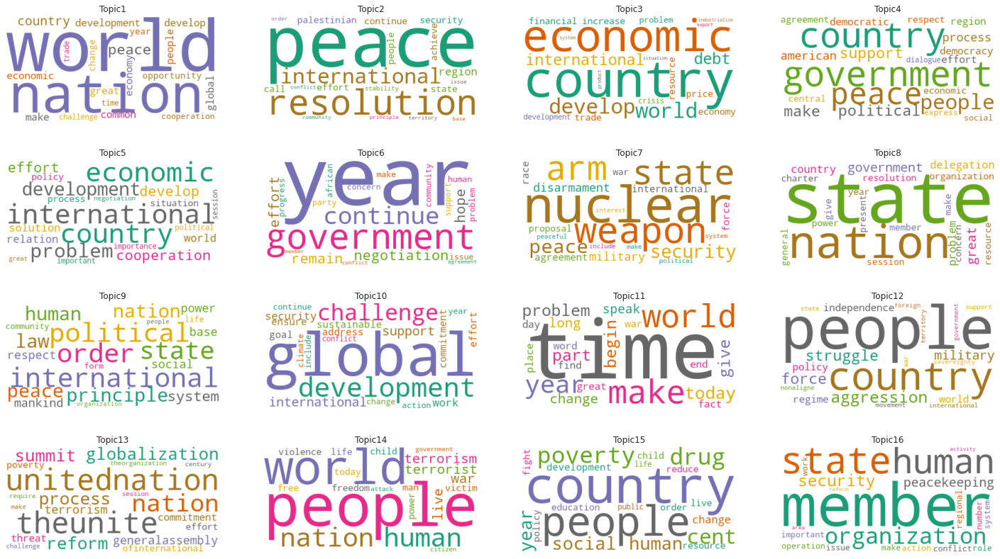

In [ ]:
# Create subplots for each topic
for i in range(16):

    wc.generate(text=topics_df["Key_Words_per_Topic"][i])
    
    plt.subplot(5, 4, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(topics_df.index[i])

plt.show()

In [ ]:
from gensim.models.ldamodel import LdaModel
def convertldaMalletToldaGen(mallet_model):
    model_gensim = LdaModel(
        id2word=mallet_model.id2word, num_topics=mallet_model.num_topics,
        alpha=mallet_model.alpha) # original function has 'eta=0' argument
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

In [ ]:
ldagensim = convertldaMalletToldaGen(ldamallet)

In [ ]:
print(pyLDAvis.__version__)

2.1.2


## Interactive Topic Visualization
 interactive graph shows the topics and relative terms. You can interactively inestigate each bubbles and get the most relevant 30 words on the right.

In [ ]:
import pyLDAvis.gensim
import pyLDAvis.gensim as gensimvis
pyLDAvis.enable_notebook()

vis_data = gensimvis.prepare(ldagensim, corpus, id2word, sort_topics=False)
pyLDAvis.display(vis_data)

## Dominant Topics for each countries





In [ ]:
# create a dataframe 
corpus_topic_df = pd.DataFrame()

# get the Titles from the original dataframe
corpus_topic_df['country'] = df_un.country

corpus_topic_df['Dominant Topic'] = [item[0]+1 for item in corpus_topics]
corpus_topic_df['Contribution %'] = [round(item[1]*100, 2) for item in corpus_topics]
corpus_topic_df['Topic Terms'] = [topics_df.iloc[t[0]]['Key_Words_per_Topic'] for t in corpus_topics]

corpus_topic_df.head(5)

,country,Dominant Topic,Contribution %,Topic Terms
1,ARG,8,31.99,"state, nation, government, great, delegation, country, problem, organization, make, charter, give, year, resolution, power, member, resource, session, general, present, concern"
2,AUS,8,27.07,"state, nation, government, great, delegation, country, problem, organization, make, charter, give, year, resolution, power, member, resource, session, general, present, concern"
4,BEL,8,19.10,"state, nation, government, great, delegation, country, problem, organization, make, charter, give, year, resolution, power, member, resource, session, general, present, concern"
5,BLR,7,27.58,"nuclear, weapon, state, arm, peace, security, military, disarmament, international, force, race, agreement, proposal, war, political, peaceful, interest, make, system, include"
6,BOL,9,23.27,"international, political, order, state, principle, human, peace, nation, law, system, respect, social, base, power, mankind, community, life, form, organization, people"


## Dominant Topics Distribution Across Speeches

The first thing we can do is look at the overall distribution of each topic across the corpus of Assembly speeches.

In [ ]:
dominant_topic_df = corpus_topic_df.groupby('Dominant Topic').agg(
                                  Doc_Count = ('Dominant Topic', np.size),
                                  Total_Docs_Perc = ('Dominant Topic', np.size)).reset_index()

dominant_topic_df['Total_Docs_Perc'] = dominant_topic_df['Total_Docs_Perc'].apply(lambda row: round((row*100) / len(corpus), 2))

dominant_topic_df

,Dominant Topic,Doc_Count,Total_Docs_Perc
0,1,84,3.52
1,2,187,7.83
2,3,71,2.97
3,4,135,5.65
4,5,116,4.86
5,6,220,9.21
6,7,90,3.77
7,8,160,6.70
8,9,166,6.95
9,10,303,12.69


## Dominant Topic Overall Percentages

In [ ]:
topic_counts = dominant_topic_df[["Dominant Topic", 	"Doc_Count", "Total_Docs_Perc"]]
topic_counts.columns  = ["Dominant Topic", 	"Document Count", "Total Document Percentage"]
topic_counts

,Dominant Topic,Document Count,Total Document Percentage
0,1,84,3.52
1,2,187,7.83
2,3,71,2.97
3,4,135,5.65
4,5,116,4.86
5,6,220,9.21
6,7,90,3.77
7,8,160,6.70
8,9,166,6.95
9,10,303,12.69


In [ ]:
df_weights = pd.DataFrame.from_records([{v: k for v, k in row} for row in tm_results])
df_weights.columns = ['Topic ' + str(i) for i in range(1,17)]
df_weights

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16
0,0.016040,0.027491,0.012376,0.020359,0.118186,0.040513,0.076111,0.319927,0.213658,0.011329,0.064659,0.011918,0.004131,0.023238,0.009889,0.030174
1,0.056188,0.021318,0.057188,0.011194,0.031066,0.183110,0.063562,0.270724,0.031816,0.016068,0.104745,0.062313,0.003632,0.012194,0.009382,0.065500
2,0.032917,0.026525,0.043097,0.076162,0.158469,0.066771,0.057617,0.190982,0.059669,0.014925,0.089972,0.012715,0.002535,0.010663,0.022500,0.134480
3,0.020716,0.016587,0.023281,0.016900,0.117250,0.006952,0.275784,0.131389,0.022218,0.009267,0.028224,0.256577,0.003386,0.018902,0.020528,0.032040
4,0.054618,0.020329,0.063491,0.056965,0.083984,0.018783,0.024221,0.232304,0.232705,0.007964,0.089995,0.057080,0.002125,0.014662,0.034182,0.006590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2383,0.041507,0.068154,0.015548,0.012697,0.023513,0.036000,0.024988,0.020760,0.030101,0.226561,0.106600,0.095981,0.003650,0.166974,0.030691,0.096276
2384,0.046157,0.019920,0.034183,0.075211,0.047390,0.017102,0.019744,0.045276,0.083311,0.140716,0.078205,0.023794,0.006185,0.059011,0.223829,0.079966
2385,0.129766,0.012608,0.088530,0.023526,0.007821,0.031085,0.029321,0.012944,0.010341,0.098524,0.070809,0.094913,0.003790,0.311592,0.057624,0.016807
2386,0.047158,0.009073,0.026033,0.176033,0.010316,0.008196,0.012875,0.016822,0.037582,0.042480,0.101106,0.165141,0.002202,0.235682,0.097889,0.011413


In [ ]:
df_weights['year'] = df_un.year.reset_index(drop=True)

In [ ]:
df_weights

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16,year
0,0.016040,0.027491,0.012376,0.020359,0.118186,0.040513,0.076111,0.319927,0.213658,0.011329,0.064659,0.011918,0.004131,0.023238,0.009889,0.030174,1970
1,0.056188,0.021318,0.057188,0.011194,0.031066,0.183110,0.063562,0.270724,0.031816,0.016068,0.104745,0.062313,0.003632,0.012194,0.009382,0.065500,1970
2,0.032917,0.026525,0.043097,0.076162,0.158469,0.066771,0.057617,0.190982,0.059669,0.014925,0.089972,0.012715,0.002535,0.010663,0.022500,0.134480,1970
3,0.020716,0.016587,0.023281,0.016900,0.117250,0.006952,0.275784,0.131389,0.022218,0.009267,0.028224,0.256577,0.003386,0.018902,0.020528,0.032040,1970
4,0.054618,0.020329,0.063491,0.056965,0.083984,0.018783,0.024221,0.232304,0.232705,0.007964,0.089995,0.057080,0.002125,0.014662,0.034182,0.006590,1970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2383,0.041507,0.068154,0.015548,0.012697,0.023513,0.036000,0.024988,0.020760,0.030101,0.226561,0.106600,0.095981,0.003650,0.166974,0.030691,0.096276,2018
2384,0.046157,0.019920,0.034183,0.075211,0.047390,0.017102,0.019744,0.045276,0.083311,0.140716,0.078205,0.023794,0.006185,0.059011,0.223829,0.079966,2018
2385,0.129766,0.012608,0.088530,0.023526,0.007821,0.031085,0.029321,0.012944,0.010341,0.098524,0.070809,0.094913,0.003790,0.311592,0.057624,0.016807,2018
2386,0.047158,0.009073,0.026033,0.176033,0.010316,0.008196,0.012875,0.016822,0.037582,0.042480,0.101106,0.165141,0.002202,0.235682,0.097889,0.011413,2018


In [ ]:
df_weights['prevalent'] = df_weights.drop('year', axis=1).idxmax(axis=1)

In [ ]:
df_weights.head()

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16,year,prevalent
0,0.016040,0.027491,0.012376,0.020359,0.118186,0.040513,0.076111,0.319927,0.213658,0.011329,0.064659,0.011918,0.004131,0.023238,0.009889,0.030174,1970,Topic 8
1,0.056188,0.021318,0.057188,0.011194,0.031066,0.183110,0.063562,0.270724,0.031816,0.016068,0.104745,0.062313,0.003632,0.012194,0.009382,0.065500,1970,Topic 8
2,0.032917,0.026525,0.043097,0.076162,0.158469,0.066771,0.057617,0.190982,0.059669,0.014925,0.089972,0.012715,0.002535,0.010663,0.022500,0.134480,1970,Topic 8
3,0.020716,0.016587,0.023281,0.016900,0.117250,0.006952,0.275784,0.131389,0.022218,0.009267,0.028224,0.256577,0.003386,0.018902,0.020528,0.032040,1970,Topic 7
4,0.054618,0.020329,0.063491,0.056965,0.083984,0.018783,0.024221,0.232304,0.232705,0.007964,0.089995,0.057080,0.002125,0.014662,0.034182,0.006590,1970,Topic 9


In [ ]:
df_weights.groupby('year')['prevalent'].value_counts(normalize=True)

year  prevalent
1970  Topic 8      0.657895
      Topic 9      0.105263
      Topic 12     0.078947
      Topic 11     0.052632
      Topic 7      0.052632
                     ...   
2018  Topic 2      0.080000
      Topic 1      0.040000
      Topic 12     0.040000
      Topic 11     0.020000
      Topic 4      0.020000
Name: prevalent, Length: 485, dtype: float64

In [ ]:
df_dominance = df_weights.groupby('year')['prevalent'].value_counts(normalize=True).unstack().fillna(0)
df_dominance

## Topic Distribution From 1970 - 2018

In [ ]:
df_dominance_year = df_weights.groupby('year')['prevalent'].value_counts(normalize=True).unstack().fillna(0).reset_index().copy()
df_dominance_year.head(5)

prevalent,year,Topic 1,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9
0,1970,0.000000,0.0,0.052632,0.078947,0.0,0.000000,0.0,0.0,0.000000,0.000,0.000000,0.026316,0.026316,0.052632,0.657895,0.105263
1,1971,0.000000,0.0,0.021277,0.106383,0.0,0.000000,0.0,0.0,0.042553,0.000,0.021277,0.021277,0.106383,0.042553,0.574468,0.063830
2,1972,0.000000,0.0,0.020833,0.083333,0.0,0.020833,0.0,0.0,0.000000,0.000,0.000000,0.083333,0.083333,0.062500,0.500000,0.145833
3,1973,0.040816,0.0,0.061224,0.081633,0.0,0.020408,0.0,0.0,0.000000,0.000,0.020408,0.081633,0.183673,0.061224,0.285714,0.163265
4,1974,0.020833,0.0,0.000000,0.104167,0.0,0.000000,0.0,0.0,0.020833,0.125,0.020833,0.083333,0.187500,0.062500,0.291667,0.083333


In [ ]:
df_melted_year_mallet = df_dominance_year.melt(id_vars= 'year' , value_vars=['Topic ' + str(i) for i in range(1, 17)], var_name='Topic', value_name='prevelance')

In [ ]:
df_melted_year_mallet

,year,Topic,prevelance
0,1970,Topic 1,0.000000
1,1971,Topic 1,0.000000
2,1972,Topic 1,0.000000
3,1973,Topic 1,0.040816
4,1974,Topic 1,0.020833
...,...,...,...
779,2014,Topic 16,0.000000
780,2015,Topic 16,0.000000
781,2016,Topic 16,0.000000
782,2017,Topic 16,0.000000


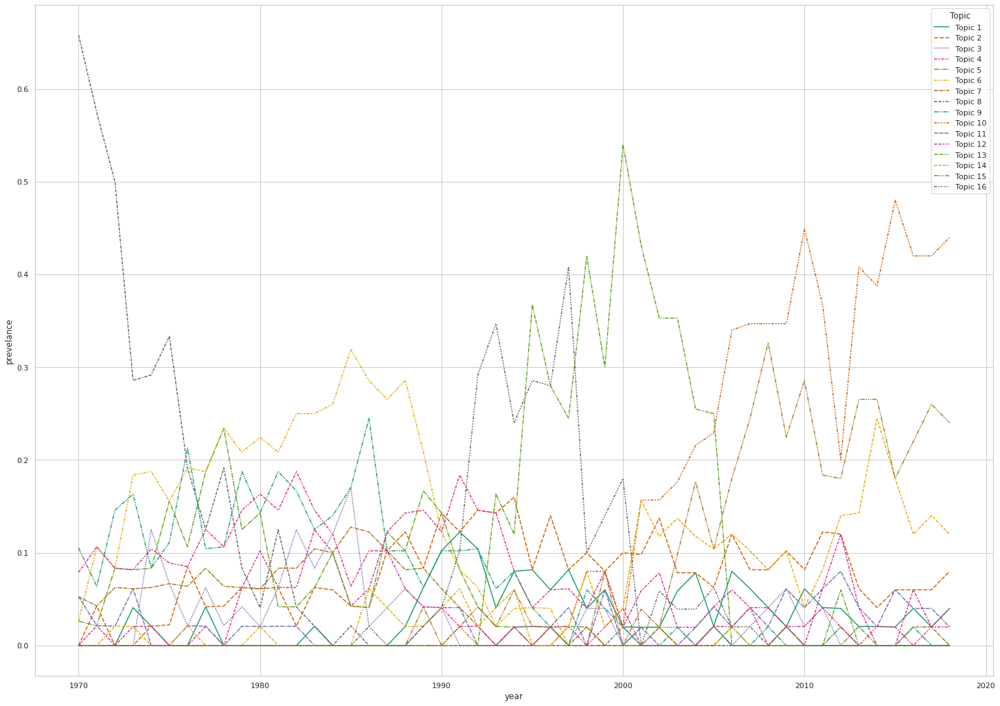

In [ ]:
sns.set_style("whitegrid")
_ = sns.lineplot(data=df_melted_year_mallet, x="year", y="prevelance", hue="Topic", style="Topic", palette='Dark2')


## Topic Distribution across different coutries

In [ ]:
df_un.country.reset_index(drop = True)

0       ARG
1       AUS
2       BEL
3       BLR
4       BOL
       ... 
2383    UKR
2384    URY
2385    USA
2386    VEN
2387    ZAF
Name: country, Length: 2388, dtype: object

In [ ]:
df_weights["country"] = df_un.country.reset_index(drop = True)

In [ ]:
df_weights

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16,year,prevalent,country
0,0.016040,0.027491,0.012376,0.020359,0.118186,0.040513,0.076111,0.319927,0.213658,0.011329,0.064659,0.011918,0.004131,0.023238,0.009889,0.030174,1970,Topic 8,ARG
1,0.056188,0.021318,0.057188,0.011194,0.031066,0.183110,0.063562,0.270724,0.031816,0.016068,0.104745,0.062313,0.003632,0.012194,0.009382,0.065500,1970,Topic 8,AUS
2,0.032917,0.026525,0.043097,0.076162,0.158469,0.066771,0.057617,0.190982,0.059669,0.014925,0.089972,0.012715,0.002535,0.010663,0.022500,0.134480,1970,Topic 8,BEL
3,0.020716,0.016587,0.023281,0.016900,0.117250,0.006952,0.275784,0.131389,0.022218,0.009267,0.028224,0.256577,0.003386,0.018902,0.020528,0.032040,1970,Topic 7,BLR
4,0.054618,0.020329,0.063491,0.056965,0.083984,0.018783,0.024221,0.232304,0.232705,0.007964,0.089995,0.057080,0.002125,0.014662,0.034182,0.006590,1970,Topic 9,BOL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2383,0.041507,0.068154,0.015548,0.012697,0.023513,0.036000,0.024988,0.020760,0.030101,0.226561,0.106600,0.095981,0.003650,0.166974,0.030691,0.096276,2018,Topic 10,UKR
2384,0.046157,0.019920,0.034183,0.075211,0.047390,0.017102,0.019744,0.045276,0.083311,0.140716,0.078205,0.023794,0.006185,0.059011,0.223829,0.079966,2018,Topic 15,URY
2385,0.129766,0.012608,0.088530,0.023526,0.007821,0.031085,0.029321,0.012944,0.010341,0.098524,0.070809,0.094913,0.003790,0.311592,0.057624,0.016807,2018,Topic 14,USA
2386,0.047158,0.009073,0.026033,0.176033,0.010316,0.008196,0.012875,0.016822,0.037582,0.042480,0.101106,0.165141,0.002202,0.235682,0.097889,0.011413,2018,Topic 14,VEN


In [ ]:
df_country = df_weights.groupby(['country', 'year'])['prevalent'].value_counts(normalize=True).unstack().fillna(0)
df_country

prevalent     Topic 1  Topic 10  Topic 11  ...  Topic 7  Topic 8  Topic 9
country year                               ...                           
ARG     1970  0.0      0.0       0.0       ...  0.0      1.0      0.0    
        1971  0.0      0.0       0.0       ...  0.0      1.0      0.0    
        1972  0.0      0.0       0.0       ...  0.0      1.0      0.0    
        1973  0.0      0.0       0.0       ...  0.0      0.0      1.0    
        1974  0.0      0.0       0.0       ...  0.0      1.0      0.0    
...           ...      ...       ...       ...  ...      ...      ...    
ZAF     2014  0.0      1.0       0.0       ...  0.0      0.0      0.0    
        2015  0.0      1.0       0.0       ...  0.0      0.0      0.0    
        2016  0.0      1.0       0.0       ...  0.0      0.0      0.0    
        2017  0.0      1.0       0.0       ...  0.0      0.0      0.0    
        2018  0.0      1.0       0.0       ...  0.0      0.0      0.0    

[2388 rows x 16 columns]

In [ ]:
df_country.reset_index(inplace=True)

In [ ]:
df_country

prevalent,country,year,Topic 1,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9
0,ARG,1970,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,ARG,1971,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,ARG,1972,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,ARG,1973,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,ARG,1974,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2383,ZAF,2014,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2384,ZAF,2015,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2385,ZAF,2016,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2386,ZAF,2017,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_melted = df_country.melt(id_vars=['country', 'year'], value_vars=['Topic ' + str(i) for i in range(1,17)], var_name='Topic', value_name='prevalence')

In [ ]:
df_melted

,country,year,Topic,prevalence
0,ARG,1970,Topic 1,0.0
1,ARG,1971,Topic 1,0.0
2,ARG,1972,Topic 1,0.0
3,ARG,1973,Topic 1,0.0
4,ARG,1974,Topic 1,0.0
...,...,...,...,...
38203,ZAF,2014,Topic 16,0.0
38204,ZAF,2015,Topic 16,0.0
38205,ZAF,2016,Topic 16,0.0
38206,ZAF,2017,Topic 16,0.0


In [ ]:
sns.relplot(x='year', y="prevalence", col="country", col_wrap=3, hue='Topic',
data=df_melted,
kind="line",
height=10,
style="Topic",
dashes=False,
ci=None,
palette = 'Dark2');

## Stacked Area Visualization

In [ ]:
df_country

prevalent,country,year,Topic 1,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9
0,ARG,1970,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,ARG,1971,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,ARG,1972,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,ARG,1973,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,ARG,1974,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2383,ZAF,2014,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2384,ZAF,2015,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2385,ZAF,2016,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2386,ZAF,2017,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_country.set_index(['country', 'year'], inplace=True)

In [ ]:
# set the figure size
plt.rcParams['figure.figsize'] = [10, 6]

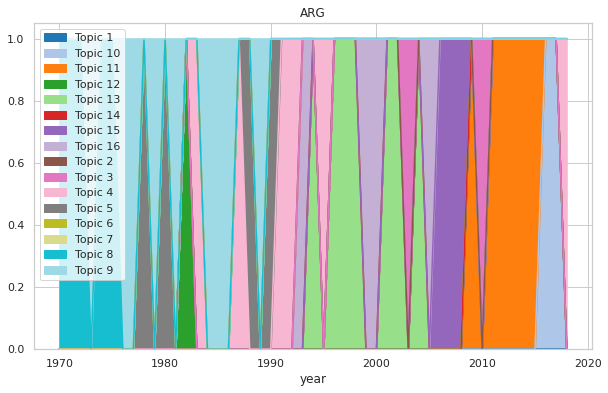

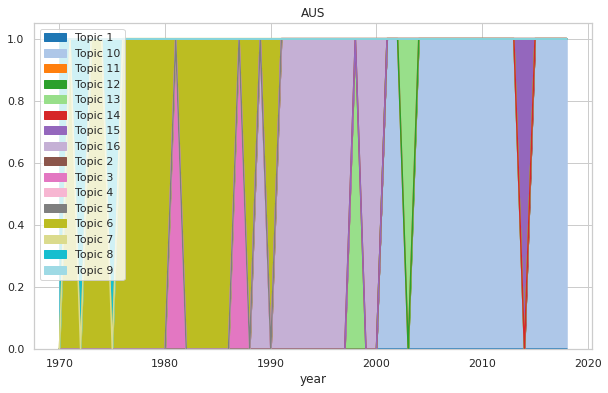

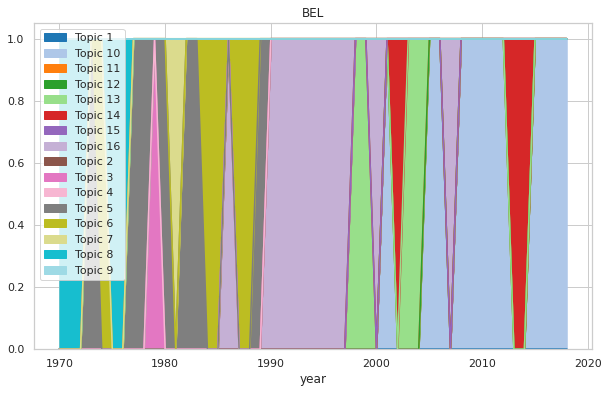

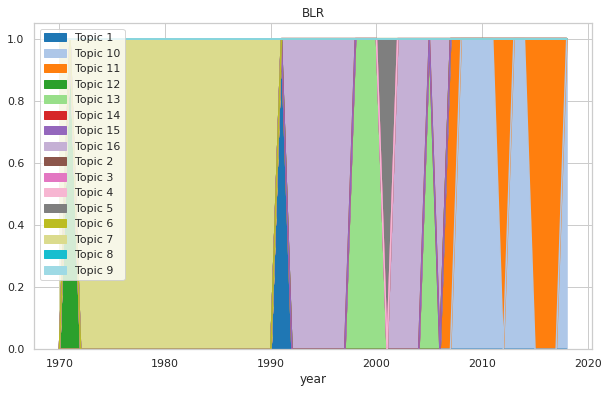

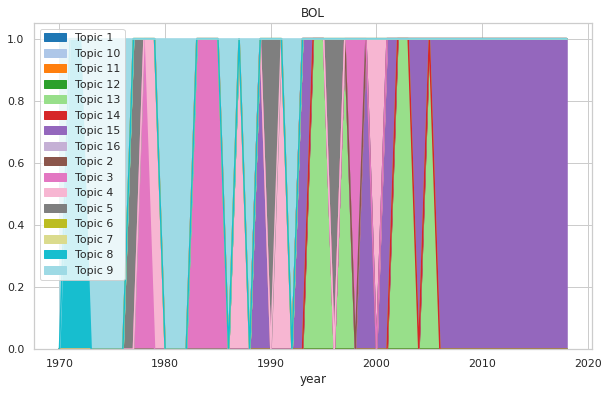

...

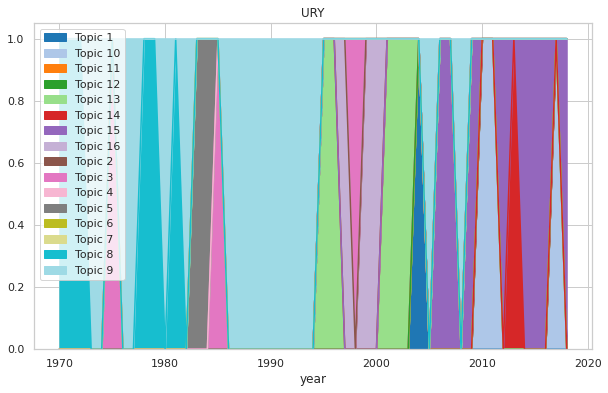

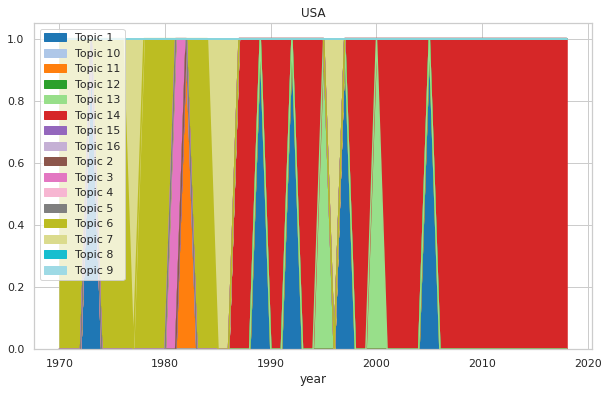

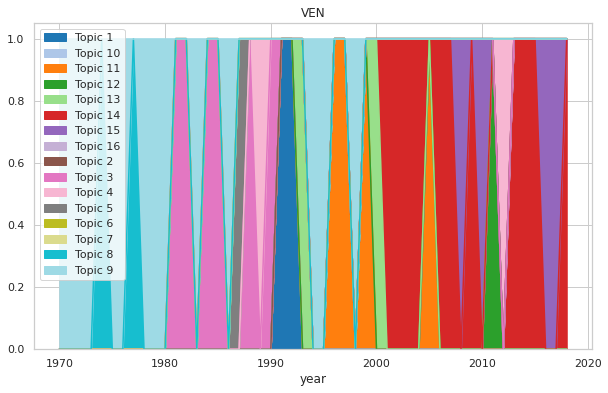

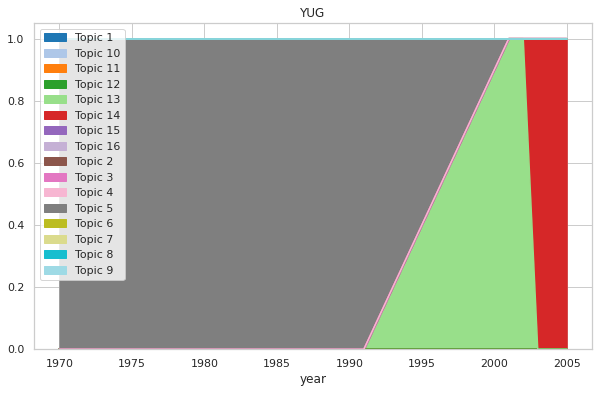

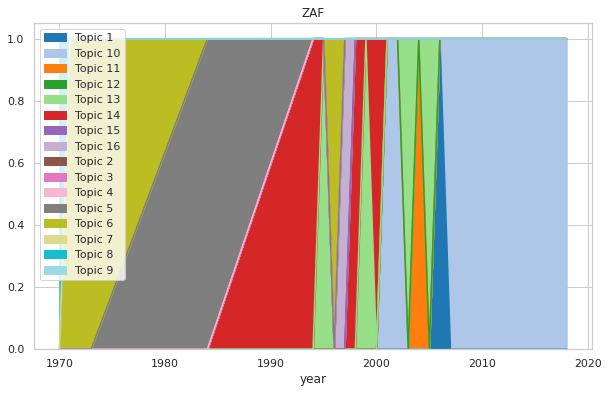

In [ ]:
for j in df_country.index.levels[0]:
  df_country.xs(j, level=0).plot.area(colormap='tab20')
  plt.title(j)
  plt.legend(loc='upper left')

plt.show()